# KLASIFIKASI PENGGUNAAN KALIMAT UJARAN KEBENCIAN PADA CHAT WHATSAPP MENGGUNAKAN ALGORITMA RANDOM FOREST  


# membaca dataset

In [1]:
import pandas as pd
import numpy as np
import re

In [2]:
df=pd.read_csv('mahasiswa.csv', encoding= 'latin1', sep=';')
df

,chat,Unnamed: 1,Unnamed: 2
0,27/08/2020 11.46 - +62 855-5906-0017: Jangan l...,NaN,NaN
1,28/08/2020 23.45 - +62 812-1415-2210: Assalamu...,NaN,NaN
2,28/08/2020 23.50 - +62 859-7539-1625: <Media t...,NaN,NaN
3,28/08/2020 23.51 - +62 878-2415-1233: Waalaiku...,NaN,NaN
4,28/08/2020 23.51 - +62 878-6912-2149: Dih gaad...,NaN,NaN
...,...,...,...
24853,26/08/2020 00.45 - +62 857-5907-2081: Dpp belu...,NaN,NaN
24854,26/08/2020 00.48 - +62 857-5907-2081: Padahak ...,NaN,NaN
24855,26/08/2020 00.49 - +62 858-1027-7486: Iyaa ane...,NaN,NaN
24856,26/08/2020 00.49 - +62 858-1027-7486: Muncul n...,NaN,NaN


# Pre-processing

In [3]:
# menghapus Unnamed
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

In [4]:
corpus = pd.read_csv("corpus.csv")

# import data
df = pd.read_csv('mahasiswa.csv', encoding= 'latin1', sep=';')

# menghapus Unnamed
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

# hapus baris yang mengandung nilai NaN pada kolom 'chat' dan 'label'
df = df.dropna(subset=['chat'])

# inisialisasi kolom label
df['label'] = 'tidak ujaran kebencian'

# loop melalui setiap kata dalam corpus dan ubah nilai label jika kata terdapat pada kalimat
for i, row in corpus.iterrows():
    mask = df['chat'].str.contains(row['kata'])
    df.loc[mask, 'label'] = row['kategori']

# tampilkan dataframe hasil labeling
df


,chat,label
0,27/08/2020 11.46 - +62 855-5906-0017: Jangan l...,tidak ujaran kebencian
1,28/08/2020 23.45 - +62 812-1415-2210: Assalamu...,ujaran kebencian
2,28/08/2020 23.50 - +62 859-7539-1625: <Media t...,tidak ujaran kebencian
3,28/08/2020 23.51 - +62 878-2415-1233: Waalaiku...,tidak ujaran kebencian
4,28/08/2020 23.51 - +62 878-6912-2149: Dih gaad...,tidak ujaran kebencian
...,...,...
24853,26/08/2020 00.45 - +62 857-5907-2081: Dpp belu...,tidak ujaran kebencian
24854,26/08/2020 00.48 - +62 857-5907-2081: Padahak ...,tidak ujaran kebencian
24855,26/08/2020 00.49 - +62 858-1027-7486: Iyaa ane...,tidak ujaran kebencian
24856,26/08/2020 00.49 - +62 858-1027-7486: Muncul n...,tidak ujaran kebencian


In [5]:
#copy dataset mhs
dataku = df.copy()

In [6]:
#Menhapus NA (data kosong)
dataku = dataku.replace('', np.nan).dropna()

#Menghapus data yang duplicates
dataku = dataku.drop_duplicates(subset=['chat'])
dataku

,chat,label
0,27/08/2020 11.46 - +62 855-5906-0017: Jangan l...,tidak ujaran kebencian
1,28/08/2020 23.45 - +62 812-1415-2210: Assalamu...,ujaran kebencian
2,28/08/2020 23.50 - +62 859-7539-1625: <Media t...,tidak ujaran kebencian
3,28/08/2020 23.51 - +62 878-2415-1233: Waalaiku...,tidak ujaran kebencian
4,28/08/2020 23.51 - +62 878-6912-2149: Dih gaad...,tidak ujaran kebencian
...,...,...
24853,26/08/2020 00.45 - +62 857-5907-2081: Dpp belu...,tidak ujaran kebencian
24854,26/08/2020 00.48 - +62 857-5907-2081: Padahak ...,tidak ujaran kebencian
24855,26/08/2020 00.49 - +62 858-1027-7486: Iyaa ane...,tidak ujaran kebencian
24856,26/08/2020 00.49 - +62 858-1027-7486: Muncul n...,tidak ujaran kebencian


In [7]:
#memanggil dataset yang sudah di normalisasi
df_norm = pd.read_csv("dataku_norm.csv", encoding= 'latin1', sep=';')

df_kamus = {}
for dt in df_norm.itertuples():
    df_kamus[dt[1]] = dt[2]

def preprocess(row):
    # hapus nomer telpon
    row['chat'] = re.sub(r"\d+", "", (row['chat']))
    # case folding (mengubah huruf kecil)
    row['chat'] = row['chat'].lower()
    # hapus tanda baca
    row['chat'] = re.sub(r"[^A-Za-z0-9]+"," ",(row['chat']))
    # normalisasi kata
    row['chat'] = ' '.join([df_kamus[a] if a in df_kamus else a for a in row['chat'].split()])
    return row
    

dataku = dataku.apply(preprocess, axis=1)  
dataku.head()

,chat,label
0,jangan lupa euy pembayaran dpp batasnya sampai...,tidak ujaran kebencian
1,assalamu alaikum kawan kawan maaf sebelumnya a...,ujaran kebencian
2,media tidak disertakan,tidak ujaran kebencian
3,waalaikumsalam,tidak ujaran kebencian
4,dih tidak ada kali niat kamu balas salam,tidak ujaran kebencian


In [8]:
corpus = pd.read_csv("corpus.csv")

# import data
# df = pd.read_csv('mahasiswa.csv', encoding= 'latin1', sep=';')

# menghapus Unnamed
dataku = dataku.loc[:, ~df.columns.str.contains('^Unnamed')]

# hapus baris yang mengandung nilai NaN pada kolom 'chat' dan 'label'
dataku = dataku.dropna(subset=['chat'])

# inisialisasi kolom label
dataku['label'] = 'tidak ujaran kebencian'

# loop melalui setiap kata dalam corpus dan ubah nilai label jika kata terdapat pada kalimat
for i, row in corpus.iterrows():
    mask = df['chat'].str.contains(row['kata'])
    dataku.loc[mask, 'label'] = row['kategori']

# tampilkan dataframe hasil labeling
dataku


,chat,label
0,jangan lupa euy pembayaran dpp batasnya sampai...,tidak ujaran kebencian
1,assalamu alaikum kawan kawan maaf sebelumnya a...,ujaran kebencian
2,media tidak disertakan,tidak ujaran kebencian
3,waalaikumsalam,tidak ujaran kebencian
4,dih tidak ada kali niat kamu balas salam,tidak ujaran kebencian
...,...,...
24853,dpp belum cenah,tidak ujaran kebencian
24854,pedahal urg beres perwalian,tidak ujaran kebencian
24855,iya aneh iya kok bisa begitu,tidak ujaran kebencian
24856,muncul nya ge sedikit sedikit keluar nilai nya,tidak ujaran kebencian


In [9]:
import requests
def stopwords():
    r = requests.get("https://raw.githubusercontent.com/masdevid/ID-Stopwords/master/id.stopwords.02.01.2016.txt").text
    data = []
    for x in r.split("\n"):
        data.append(x)
    return data

In [10]:
pip install pySastrawi

Note: you may need to restart the kernel to use updated packages.


In [11]:
# Import Stopword Factory class
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

#Create factory
factory = StopWordRemoverFactory()
more_stopword = ['nya','kali','sih','yg','tidaknya','mah','lah','kok','yah','bah','bro','sis','sist','dong','tuh','oh','begitu','dymmm','sib','vvpl','wkwkkw','sapd'
                ,'pas','donk','dongs','hehe','haha','hihi','dih','duh','wah','ya','yah','eh','deh','dah','wkwk','wkwkwk','wow','si','guys','gaes','akang','teteh','sus'
                ,'bang','kak','mah','yuk','bet','loh','woy','doang','tuh','euy','doi','yuhu','ada','aku','akuu','aing','abdi','urg','urang','gw','gue','gua','elu','lu','kamu','mnh','maneh','sia','yang','kalau'
                ,'jos','key','kita','gitu','aja','saja','abang','ah','ih','hey','pubg','jt','om','ha','ohh','lala','dymm','tingky','wingky','wehhh','dipsy','yahhhh','nahhhhh'
                ,'ih','woi','ew','lur','da','kyung','aa','yuk','dhyaz' ,'pakde','uwu','tos','po','http','bit','ly','fitra','euy','ananda','adymas','faisal','dc','caca','wksk','lohh'
                 'wiki','dendi','fajar','aditian','riki','hamzah','atang','majesky','badminton','nauval','arfan','gian','sulthan','irpan','yoga','jhonatan','basket','dymm','woyyy',
                 'febrian','wardi','teknik', 'informatika','via','fariz','hm','hmmm','ludo','zis','teh','dpp','indri','huh','ss','daspro','kplbo','an','poo','wkwjw','fittt','rahmat'
                ,'hehe','sia','tah','wkwkw','uhuy','uhuyyy','link','nrp','beb','ridha','devy','febriyanti','muhamad','aswin','kasyfi','eh','ehh','fadly','sapd','mcl','ade','sib','gaisss'
                ,'gass','gas','ez','rudi','leony','erik','agus','depoy','hasbi','cesar','elang','hardi','anas','azis','aziz','rakeyan','rkeyan','dipsy','nabila','ihhh','cokkkk','cv'
                ,'dimas','fikri','fiqri','fiq','rid','dym','sal','dit','den','ahmad','devy','deni','ayi','fery','gasss','rahmad','gerrr','dph','koor','aswin','putra','aditt','tecnho','techno'
                ,'putri','anu','anugrah','fajari','dymas','pb','ipb','itb','jonas','ugm','fisip','unisba','bjb','bni','firdaus','taufik','alawil','nadia','aliff','alif','ngabbbb',
                 'adhadini','abdul','moch','deliana','restuti','kurniadi','inday','suci','fitriany','risma','babung','maul','mauli','al','hakim','surya','arjun','azvya','ersteven','rudy'
                ,'imbaloputra','rifky','gilang','pratama','rezha','atmaja','rafidianto','muhammad','daffa','firdaus','ilham','ilyasa','ridho','nisa','oalah','firgia','yansyah','cm','wkkw'
                 ,'tegar','dwiki','viky','kurniawan','hah','ea','hendra','komara','jonathan','ojan','m','r','a','b','c','d','e','f','g','h','i','j','k','l','n','o','p','q','t','s','akwk'
                ,'u','v','w','x','y','z','anisa','depoy','wiky','waalaikumsalam','hadi','ky','ul','wih','wihh','by','adrian','un','oh','ohgt','bas','wa','nah','nahh','ces','wah','wahh',
                 'au','pan','fan','anggoro','cuy','cuyy','cok','cuk','delia','kasyy','kas','kasy','nad','rifki','andra','ull','denn','fit','adit','isal','sal','cok','cokk','evos','fitt'
                ,'www','zzz','amin','wr','wb','em','emm','jon','com','wkwkwkw','ask','nis','dim','vio','kasfhy','vi','wanda','gempi','tirta','fadli','joni','laa','drajat','dendy','ib','gbla',
                 'rrq','onic','yu','oyyy','sall','vanesa','ah','ahh','fitraa','fitraaa','dondi','isall','rivia','hoala','ferry','hehe','hehehe','cc','iki','febri','febry','lif','ki','tut',
                 'sul','dody','firmansyah','ziyan','acep','put','zul','alah','pc','ysh','ai','nehh','budi','hartawan','ek','utut','gais','mila','rachmat','sari','vs','aaa','mang','txt','rizky',
                 'hmm','reza','vip','darmawan','vcf','pajar','tama','gunawan','fauzan','mppl','vvl','kpl','anis','fitria','nurfalah','khoiril','fitri','cp','zyan','yan','pa','cod','mas','jng',
                'cukkk','andriana','hahaha','rikiforkaang','tiis','up','japri','wwk','wkwkwkwk','oalahh','rizki','pki','psi','wwkwk','mjl','ehhh','luurrr','ehe','sks','apsinya','nyaa','awokwokwokwokw'
                ,'sttt','siah','va','ridh','ppi','slur','bug','wkwwkwk','wwkwk','kwwk','mui','wkwkwkwk','fakih','wkww','leony','wohhuhhh','wkke','jan','owhh','riviaaa','uhuyy','aishh',
                'siy','uluh','yach','kl','lief','hahaha','gb','ac','wkkkwk','hahahahaha','wkwkwkwkwk','wkwkwkwk','pkkmb','doni','fi','alief','uhh','wkwkwkwkwwk','hh','vcs','pbk',
                'hahahahahaahahahaha','wkwkwkwkw','waw','euyy','msi','waalaikumussalam','sofyan','wkw','ekwowkowkwowkw','wkwkok','wiki','aii','wkkww','wkwkk','wkwkokwkok',
                'aulia','wkkww','akwoakwowkwo','wkwkwkkw','isalll','ohhh','wahhh','wahhhh','eps','saya','kalian','di','eheh','pkm','pkkmb','hello','it','uy','astaga','gmeet','zoom',
                'plis','pliss','plisss','mbkm','ria','byusulll','kmtif','xxviii','rio','gengs','afla','cmiiw','henny','ti','adm','kick','hask','pis','bjir','dt','hp','dhmd',
                'kwkwkw','cuaksss','jatt','ari','nurcahyo','sekre','yeah','yeuh','asepnya','ahaha','ih','ihhhh','astaga','babunh','riviaa','wk','pi','mariiii','alhamdulillah','btw','re',
                'raga','wadu','waduh','gfrom','bph','cnah','yahhhhh','astagfirulloh','yaalloh','oalaaahh','nge','initeh','bri','cs','tara','pas','ihh','cunggggg','iyal','mely','form',
                'xixixi','yup','wkwkkwk','vd','set','mma','dihh','wasalamualaikum','lurr','ips','wkwkwwkw','wkkwk','mk','yaps','st','epsa','ser','skem','cn','assalamualaikum','assalamu',
                 'alaikum','tq','alpro','krs','edlink','dsi','ee','ifp','ifw','js','uwey','hai','kan','cieee','odet','prsha','ppt','idi','youtube','yt','channel','ipdn',
                 'innalillahi','iya']

stopwordplus = factory.get_stop_words()+stopwords()+more_stopword

dataku['chat'] = dataku['chat'].apply(lambda x: " ".join(x for x in x.split() if x not in stopwordplus))
dataku['chat']

0                         lupa pembayaran batasnya tanggal
1        kawan kawan maaf ane ninggalin tanggung emang ...
2                                         media disertakan
3                                                         
4                                               niat balas
                               ...                        
24853                                                cenah
24854                              pedahal beres perwalian
24855                                                 aneh
24856                                      muncul ge nilai
24857                              list nilai ganjil genap
Name: chat, Length: 23613, dtype: object

In [12]:
#Menhapus NA (data kosong)
dataku = dataku.replace('', np.nan).dropna()

#Menghapus data yang duplicates
dataku = dataku.drop_duplicates(subset=['chat'])
dataku

,chat,label
0,lupa pembayaran batasnya tanggal,tidak ujaran kebencian
1,kawan kawan maaf ane ninggalin tanggung emang ...,ujaran kebencian
2,media disertakan,tidak ujaran kebencian
4,niat balas,tidak ujaran kebencian
6,anjing,tidak ujaran kebencian
...,...,...
24851,terimakasih dra,tidak ujaran kebencian
24852,ningali nilai,tidak ujaran kebencian
24854,pedahal beres perwalian,tidak ujaran kebencian
24856,muncul ge nilai,tidak ujaran kebencian


# tokenize

In [13]:
import re
# Function to Tokenize words
def tokenize(text):
    tokens = re.split('\W+', text) #W+ means that either a word character (A-Za-z0-9_) or a dash (-) can go there.
    return tokens

dataku['chat'] = dataku['chat'].apply(lambda x: tokenize(x.lower())) 
#We convert to lower as Python is case-sensitive. 
dataku

,chat,label
0,"[lupa, pembayaran, batasnya, tanggal]",tidak ujaran kebencian
1,"[kawan, kawan, maaf, ane, ninggalin, tanggung,...",ujaran kebencian
2,"[media, disertakan]",tidak ujaran kebencian
4,"[niat, balas]",tidak ujaran kebencian
6,[anjing],tidak ujaran kebencian
...,...,...
24851,"[terimakasih, dra]",tidak ujaran kebencian
24852,"[ningali, nilai]",tidak ujaran kebencian
24854,"[pedahal, beres, perwalian]",tidak ujaran kebencian
24856,"[muncul, ge, nilai]",tidak ujaran kebencian


# Stemming

In [14]:
# import StemmerFactory class

from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
# create stemmer
factory = StemmerFactory()
stemmer = factory.create_stemmer()
# stemming process
def kata_stem(teks):
    stem_teks = " ".join([stemmer.stem(i) for i in teks])
    return stem_teks
dataku['chat'] = dataku['chat'].apply(lambda x: kata_stem(x))
dataku['chat'].head()

0                             lupa bayar batas tanggal
1    kawan kawan maaf ane ninggalin tanggung emang ...
2                                          media serta
4                                           niat balas
6                                               anjing
Name: chat, dtype: object

In [15]:
#Menhapus NA (data kosong)
dataku = dataku.replace('', np.nan).dropna()

#Menghapus data yang duplicates
dataku = dataku.drop_duplicates(subset=['chat'])
dataku

,chat,label
0,lupa bayar batas tanggal,tidak ujaran kebencian
1,kawan kawan maaf ane ninggalin tanggung emang ...,ujaran kebencian
2,media serta,tidak ujaran kebencian
4,niat balas,tidak ujaran kebencian
6,anjing,tidak ujaran kebencian
...,...,...
24851,terimakasih dra,tidak ujaran kebencian
24852,ningali nilai,tidak ujaran kebencian
24854,pedahal beres wali,tidak ujaran kebencian
24856,muncul ge nilai,tidak ujaran kebencian


In [16]:
# memberikan kategori 0, 1
from io import StringIO
col = ['chat', 'label']
dataku= dataku[col]
dataku= dataku[pd.notnull(dataku['chat'])]

dataku.columns = ['chat', 'label']
dataku['kategori_id'] = dataku['label'].factorize()[0]

# Sorting dari nilai kategori_id
kategori_id_data = dataku[['label', 'kategori_id']].sort_values('kategori_id')

# Membuat dictionary dari value kategori_id_data
kategori_to_id = dict(kategori_id_data.values)
id_to_kategori = dict(kategori_id_data[['kategori_id', 'label']].values)
dataku

,chat,label,kategori_id
0,lupa bayar batas tanggal,tidak ujaran kebencian,0
1,kawan kawan maaf ane ninggalin tanggung emang ...,ujaran kebencian,1
2,media serta,tidak ujaran kebencian,0
4,niat balas,tidak ujaran kebencian,0
6,anjing,tidak ujaran kebencian,0
...,...,...,...
24851,terimakasih dra,tidak ujaran kebencian,0
24852,ningali nilai,tidak ujaran kebencian,0
24854,pedahal beres wali,tidak ujaran kebencian,0
24856,muncul ge nilai,tidak ujaran kebencian,0


In [17]:
dataku = dataku.reset_index(drop=True)

In [18]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


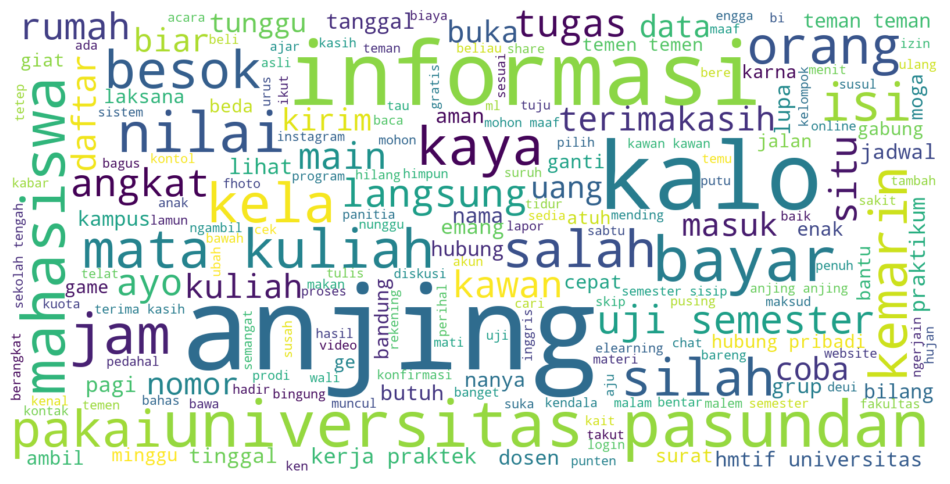

In [19]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

f = open ("mydata.csv", "r")
isi_text = f.read()

wordcloud = WordCloud(width=1600, height=800,
max_font_size=200, background_color='white')

wordcloud.generate(isi_text)

plt.figure(figsize=(12,10))

plt.imshow(wordcloud, interpolation='bilinear')

plt.axis("off")

plt.show()

# plt.savefig('my_plo.png')

# TF-IDF

In [20]:
#menghitung setiap kata yang muncul di setiap kalimatnya
from sklearn.feature_extraction.text import CountVectorizer

count_vectorizer = CountVectorizer(encoding='latin-1', ngram_range=(1, 1), tokenizer=None, analyzer = 'word', stop_words=stopwordplus)
countvec = count_vectorizer.fit_transform(dataku.chat).toarray()
countvec

C:\Users\fitra\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kurangnya', 'olah', 'sekurang', 'setidak'] not in stop_words.
  warnings.warn(


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [21]:
#buat data frame
countvec2 = pd.DataFrame(countvec)
countvec2

,0,1,2,3,4,5,6,7,8,9,...,9677,9678,9679,9680,9681,9682,9683,9684,9685,9686
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13461,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13462,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
# Menghitung TF-IDF 

from sklearn.feature_extraction.text import TfidfTransformer
transformer = TfidfTransformer(norm=None, use_idf=True, smooth_idf=False, sublinear_tf=False)
tfidf = transformer.fit_transform(countvec)
tfidf

<13464x9687 sparse matrix of type '<class 'numpy.float64'>'
	with 45134 stored elements in Compressed Sparse Row format>

In [23]:
#memberikan nama kolomnya
kata_kata = count_vectorizer.get_feature_names()
countvec3 = pd.DataFrame(countvec, columns=kata_kata)
countvec3

C:\Users\fitra\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,aaaawkwowkwowk,aab,aafihii,aalamiin,aama,aamaann,aamiin,aamiinin,aamiinn,aamiinnn,...,zenly,zerozerozero,zip,ziyann,zomnya,zona,zonk,zoomkosasih,zoomnya,zulfiqri
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13460,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13461,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13462,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [24]:
# Mengubah menjadi array
tfidf1 = tfidf.toarray()
tfidf1

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [25]:
#membuat data frame lagi
tfidf2 = pd.DataFrame(tfidf1)
tfidf2

,0,1,2,3,4,5,6,7,8,9,...,9677,9678,9679,9680,9681,9682,9683,9684,9685,9686
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13460,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13461,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13462,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [26]:
kata_kata2 = count_vectorizer.get_feature_names()
df1 = pd.DataFrame(tfidf1, columns=kata_kata2)
df1
#kalau mau disave
#df1.to_csv("df1.csv")

C:\Users\fitra\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,aaaawkwowkwowk,aab,aafihii,aalamiin,aama,aamaann,aamiin,aamiinin,aamiinn,aamiinnn,...,zenly,zerozerozero,zip,ziyann,zomnya,zona,zonk,zoomkosasih,zoomnya,zulfiqri
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13460,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13461,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13462,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
# Menggabungkan kategori_id dengan matriks tf-idf

result = pd.concat([dataku['kategori_id'],df1], axis=1)
result

,kategori_id,aaaawkwowkwowk,aab,aafihii,aalamiin,aama,aamaann,aamiin,aamiinin,aamiinn,...,zenly,zerozerozero,zip,ziyann,zomnya,zona,zonk,zoomkosasih,zoomnya,zulfiqri
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13460,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13461,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13462,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
y = result['kategori_id'] 
y

0        0
1        1
2        0
3        0
4        0
        ..
13459    0
13460    0
13461    0
13462    0
13463    0
Name: kategori_id, Length: 13464, dtype: int64

In [29]:
X=df1
X.head()

,aaaawkwowkwowk,aab,aafihii,aalamiin,aama,aamaann,aamiin,aamiinin,aamiinn,aamiinnn,...,zenly,zerozerozero,zip,ziyann,zomnya,zona,zonk,zoomkosasih,zoomnya,zulfiqri
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# balancing data

In [30]:
!pip install imbalanced-learn

In [31]:
pip install sklearn.utils

Note: you may need to restart the kernel to use updated packages.


In [32]:
import numpy as np
import pandas as pd
import pyodbc as odbc 
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from imblearn.over_sampling import SMOTE
#Add this script
import matplotlib

#Before
import matplotlib.pyplot as plt

0    11405
1     2059
Name: kategori_id, dtype: int64

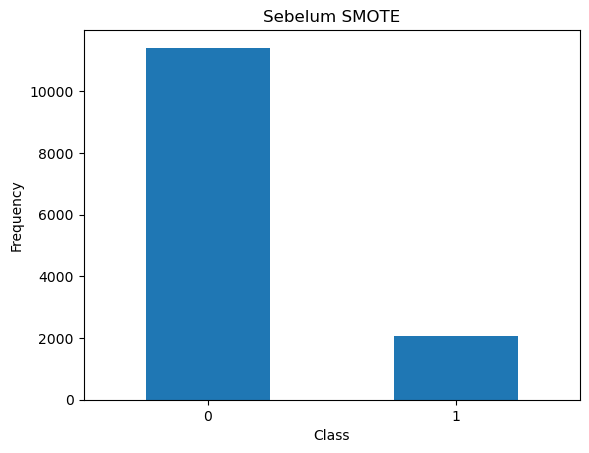

In [33]:
#melihat visualisasi datanya
pd.value_counts(y).plot.bar()
plt.title('Sebelum SMOTE')
plt.xticks(rotation=0)
plt.xlabel('Class')
plt.ylabel('Frequency')
y.value_counts()

In [34]:
#Balancing data
smote = SMOTE(sampling_strategy='minority')
X_sm, y_sm = smote.fit_resample(X, y)

0    11405
1    11405
Name: kategori_id, dtype: int64

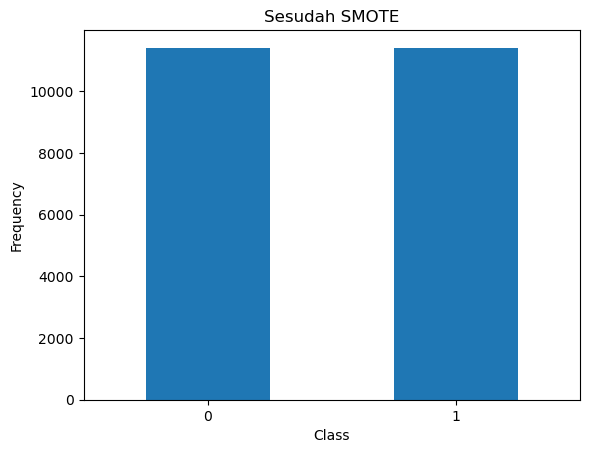

In [35]:
pd.value_counts(y_sm).plot.bar()
plt.title('Sesudah SMOTE')
plt.xticks(rotation=0)
plt.xlabel('Class')
plt.ylabel('Frequency')
pd.value_counts(y_sm)

In [36]:
X_sm.head() #cek rownya nambah

,aaaawkwowkwowk,aab,aafihii,aalamiin,aama,aamaann,aamiin,aamiinin,aamiinn,aamiinnn,...,zenly,zerozerozero,zip,ziyann,zomnya,zona,zonk,zoomkosasih,zoomnya,zulfiqri
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [37]:
y_sm.head() #cek length nya nambah

0    0
1    1
2    0
3    0
4    0
Name: kategori_id, dtype: int64

# split data

In [38]:
#membagi data training dan data testing
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

#splitting train and test

X_train, X_test, y_train, y_test = train_test_split(
    X_sm,
    y_sm,
    stratify=y_sm,
    test_size=0.2,
    random_state=123)

In [39]:
y_test.head()

9199     0
21228    1
12039    0
1399     0
10627    0
Name: kategori_id, dtype: int64

# pemodelan klasifikasi

In [40]:
#Modelling module
from sklearn.ensemble import RandomForestClassifier

#Evaluation module
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold

In [41]:
RF = RandomForestClassifier(random_state=12)

# fit the model to the training set
RF.fit(X_train, y_train)

# Predict on the test set results
y_prediksi = RF.predict(X_test)

# Check accuracy score 
from sklearn.metrics import accuracy_score
print('Model accuracy score with RandomForest : {0:0.4f}'. format(accuracy_score(y_test, y_prediksi)))

Model accuracy score with RandomForest : 0.9472


C:\Users\fitra\AppData\Local\Temp\ipykernel_8792\242375450.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,10))


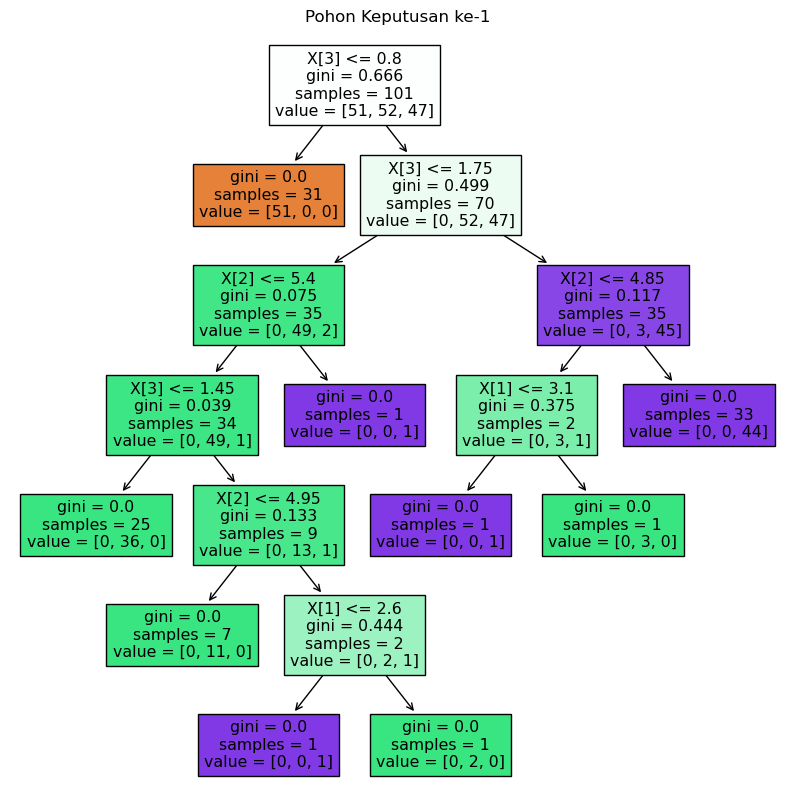

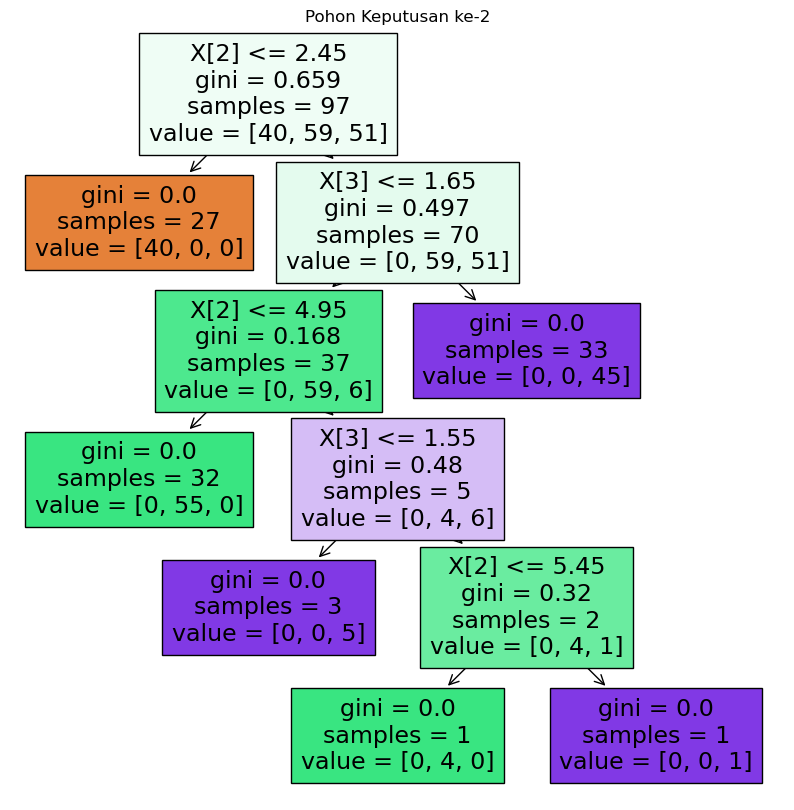

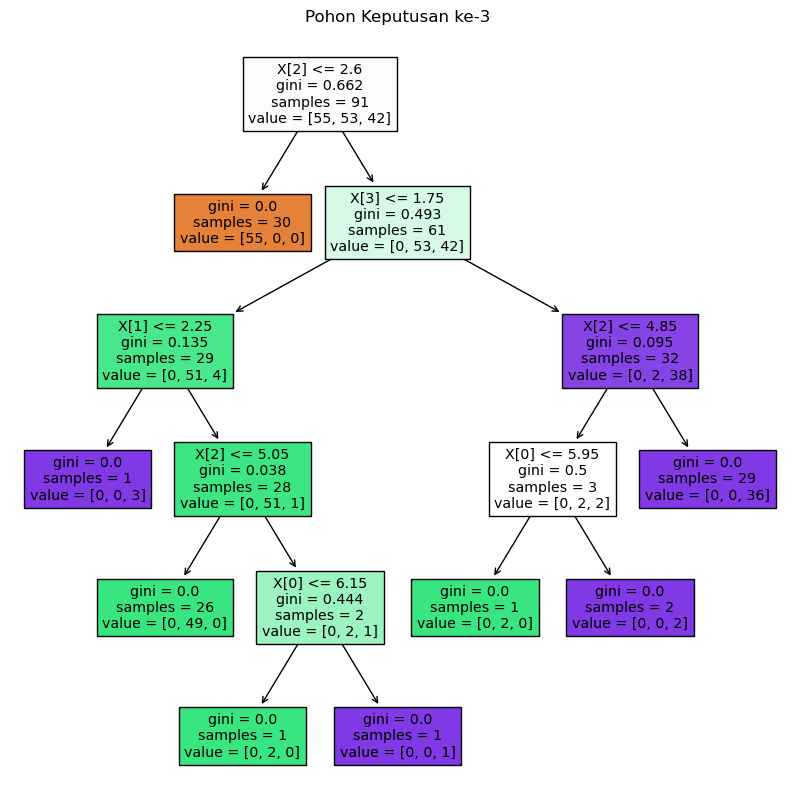

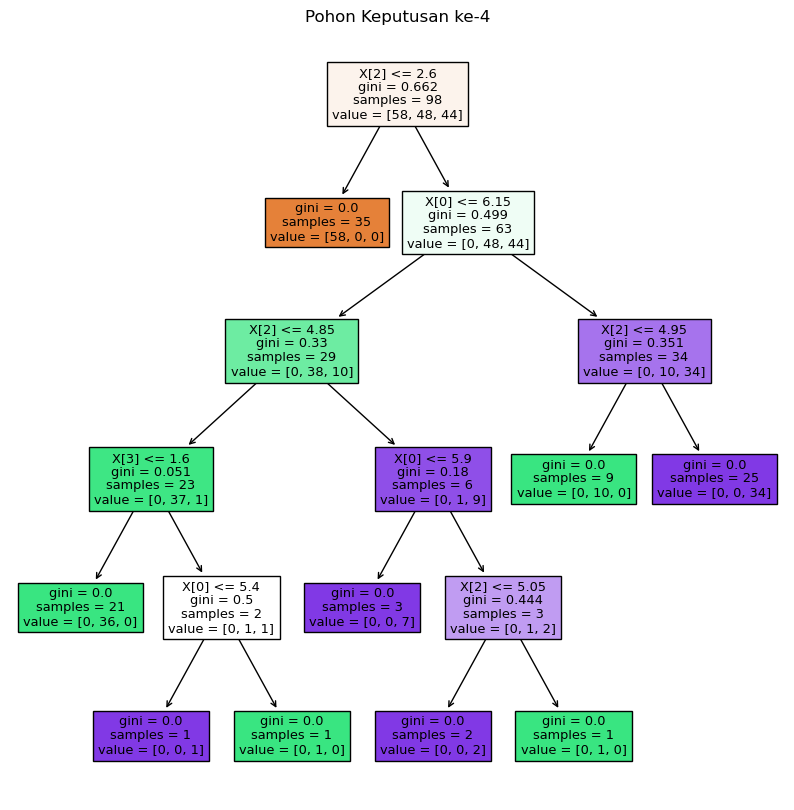

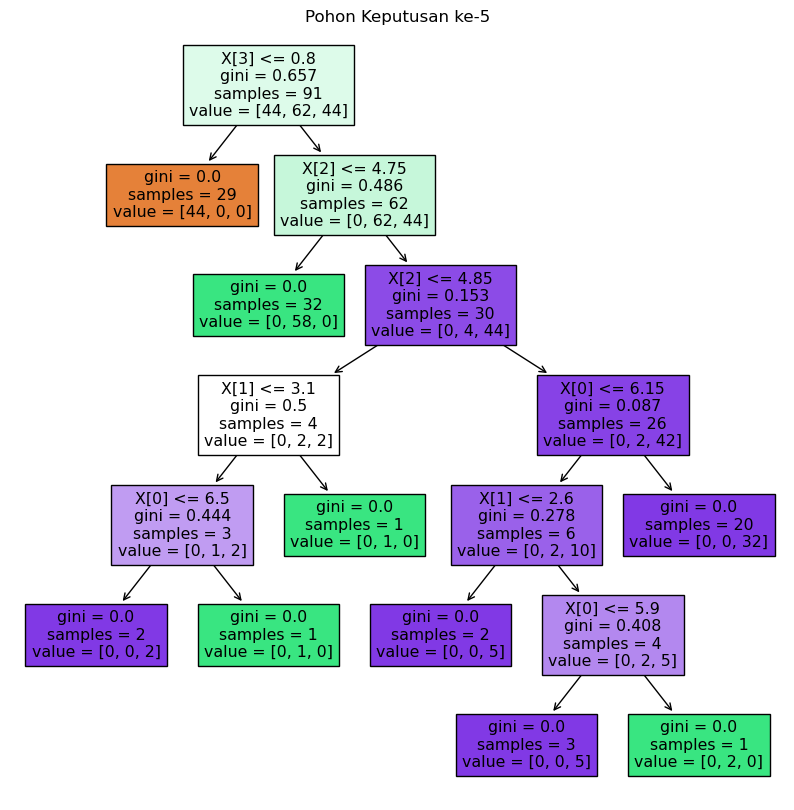

...

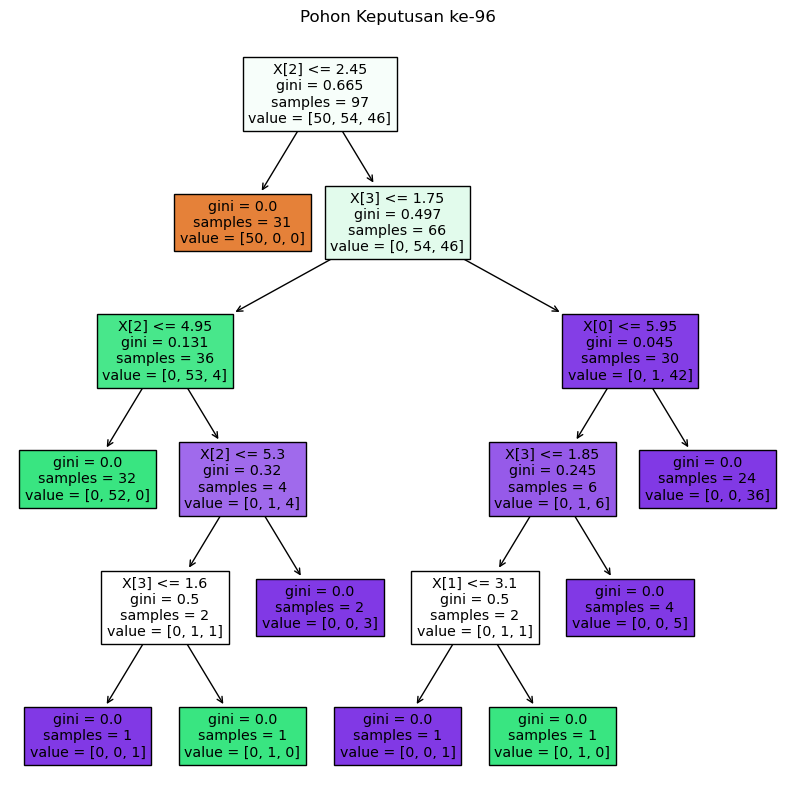

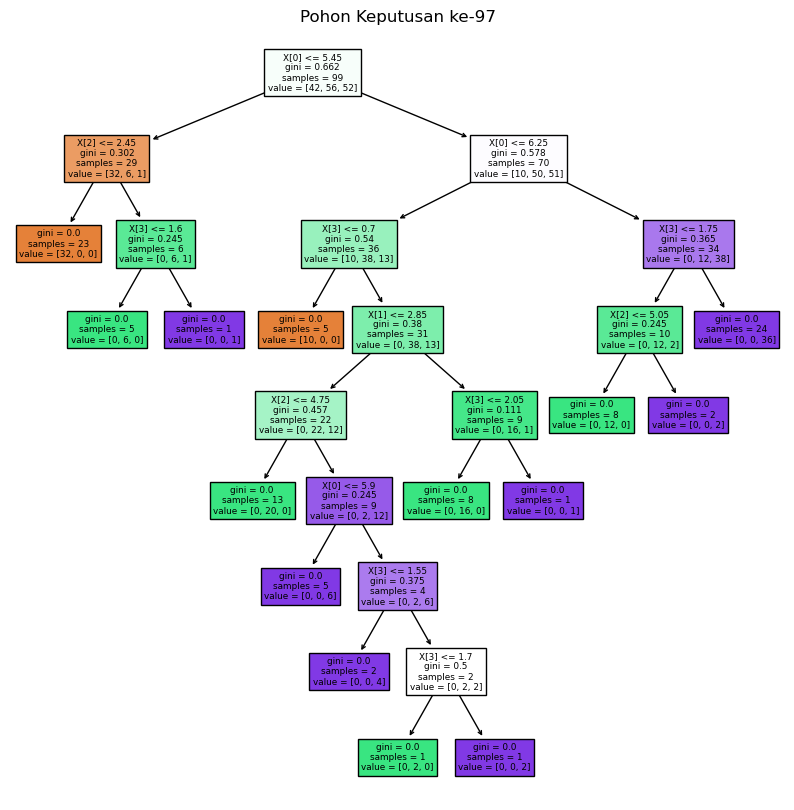

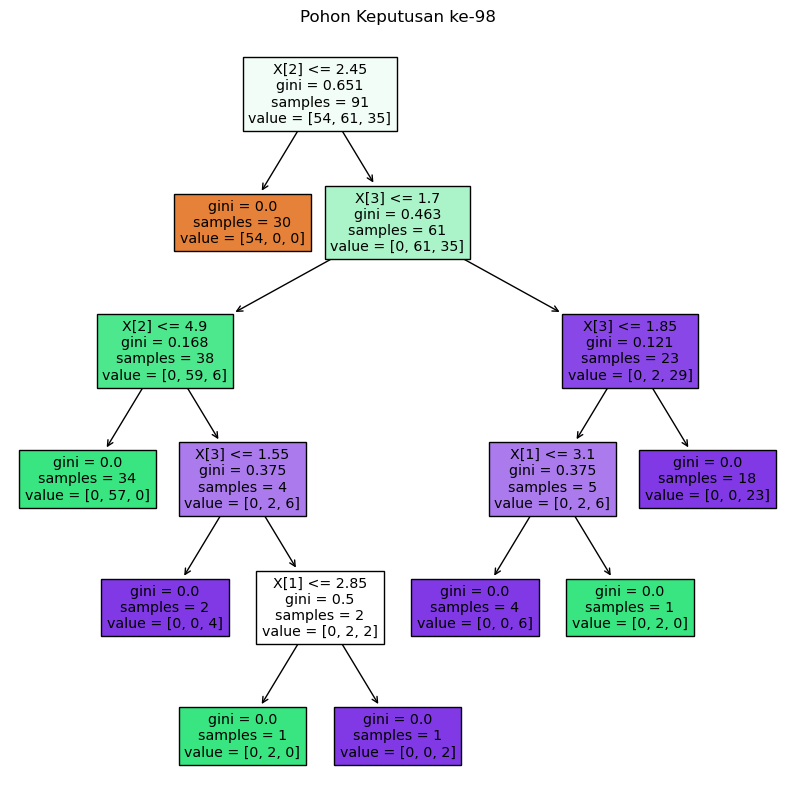

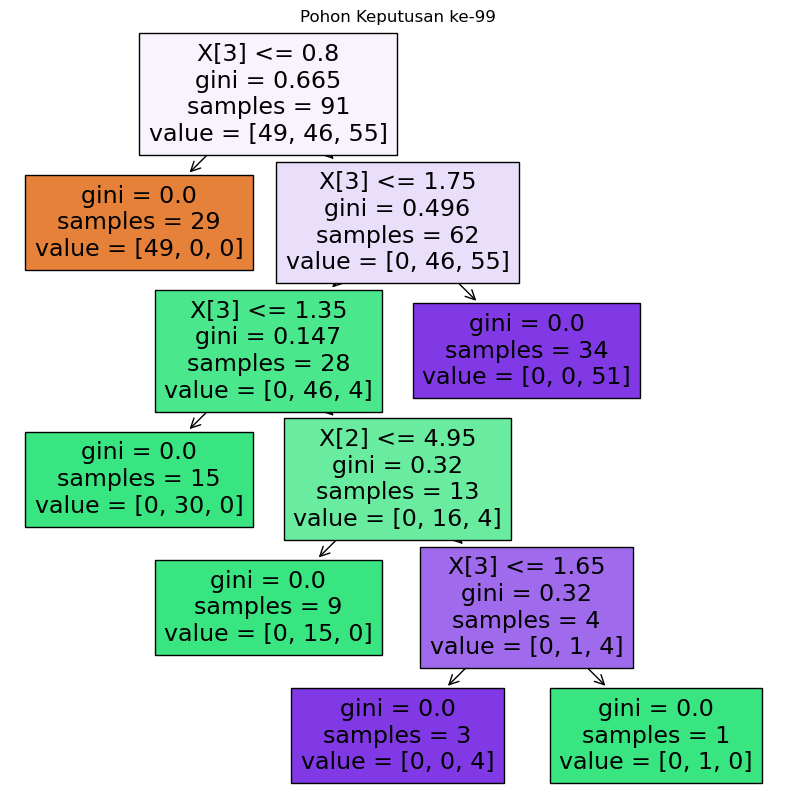

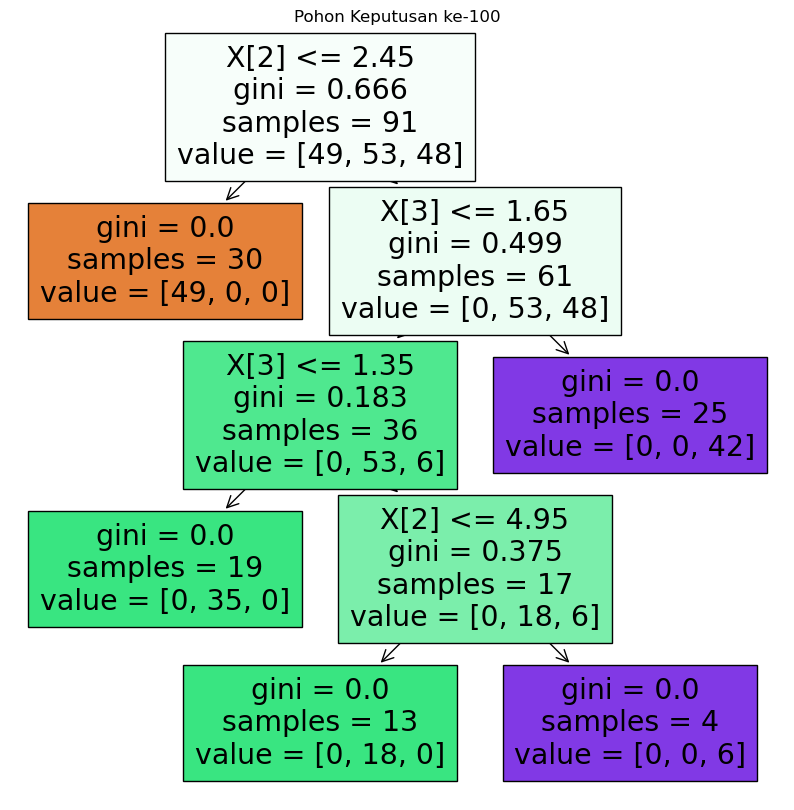

In [42]:
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree
import os

# Memuat data iris
iris = load_iris()
X = iris.data
y = iris.target

# Membuat objek model Random Forest dengan 100 pohon
rfc = RandomForestClassifier(n_estimators=100, random_state=42)

# Melatih model menggunakan data iris
rfc.fit(X, y)

# Menyimpan gambar setiap pohon keputusan dalam model
for i in range(rfc.n_estimators):
    plt.figure(figsize=(10,10))
    tree = rfc.estimators_[i]
    plot_tree(tree, filled=True)
    plt.title('Pohon Keputusan ke-{}'.format(i+1))
    # plt.savefig(os.path.join('tree_visualizations', 'tree_{}.png'.format(i+1)))
#     plt.show()


In [43]:
print(classification_report(y_test, y_prediksi))

              precision    recall  f1-score   support

           0       0.94      0.95      0.95      2281
           1       0.95      0.94      0.95      2281

    accuracy                           0.95      4562
   macro avg       0.95      0.95      0.95      4562
weighted avg       0.95      0.95      0.95      4562



In [44]:
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.model_selection import RandomizedSearchCV
# import numpy as np

# # X_train dan y_train adalah dataset training
# rfc = RandomForestClassifier()
# param_distributions = {
#     'n_estimators': np.arange(10, 101, 10),
#     'max_depth': [None] + list(np.arange(5, 20, 5)),
#     'max_features': ['sqrt', 'log2'],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }
# n_iter_search = 20

# # Randomized Search dengan 20 iterasi
# rs = RandomizedSearchCV(rfc, param_distributions=param_distributions, n_iter=n_iter_search, cv=5)
# rs.fit(X_train, y_train)

# # Menampilkan parameter terbaik dan akurasi model terbaik
# print("Best parameters:", rs.best_params_)
# print("Best accuracy:", rs.best_score_)


# Predik

In [45]:
y_test

9199     0
21228    1
12039    0
1399     0
10627    0
        ..
2664     1
2565     0
20293    1
8660     0
6750     0
Name: kategori_id, Length: 4562, dtype: int64

In [46]:
y_prediksi

array([0, 1, 0, ..., 1, 0, 0], dtype=int64)

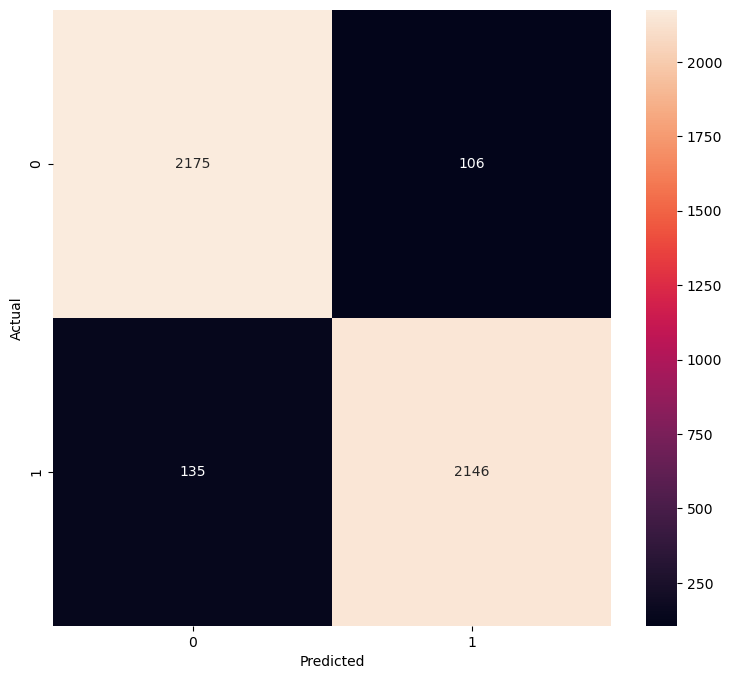

In [47]:
# Making the Confusion Matrix good visualization
from sklearn.metrics import confusion_matrix
import seaborn as sns
conf_mat = confusion_matrix(y_test, y_prediksi)
fig, ax = plt.subplots(figsize=(9,8))
sns.heatmap(conf_mat, annot=True, fmt=".0f", ax=ax)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Pipeline

In [48]:
#Model pipeline

from sklearn.pipeline import Pipeline

tf_idf = CountVectorizer(encoding='latin-1', ngram_range=(1, 1), 
                                         tokenizer=None, analyzer = 'word', stop_words=stopwordplus)
model = RandomForestClassifier(random_state=12)

modelpipeline = Pipeline([
                  ('tfidf',tf_idf),
                  ('model',model)
])

In [49]:
#Fit Pipeline
modelpipeline.fit(dataku['chat'],dataku['label'])

C:\Users\fitra\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['baiknya', 'berkali', 'kurangnya', 'olah', 'sekurang', 'setidak'] not in stop_words.
  warnings.warn(


Pipeline(steps=[('tfidf',
                 CountVectorizer(encoding='latin-1',
                                 stop_words=['a', 'ada', 'adalah', 'adanya',
                                             'adapun', 'agak', 'agaknya',
                                             'agar', 'akan', 'akankah', 'akhir',
                                             'akhiri', 'akhirnya', 'aku',
                                             'akulah', 'amat', 'amatlah',
                                             'anda', 'andalah', 'antar',
                                             'antara', 'antaranya', 'apa',
                                             'apaan', 'apabila', 'apakah',
                                             'apalagi', 'apatah', 'arti',
                                             'artinya', ...])),
                ('model', RandomForestClassifier(random_state=12))])

In [50]:
modelpipeline.predict(dataku['chat'])

array(['tidak ujaran kebencian', 'ujaran kebencian',
       'tidak ujaran kebencian', ..., 'tidak ujaran kebencian',
       'tidak ujaran kebencian', 'tidak ujaran kebencian'], dtype=object)

In [97]:
post="kamu gila"

In [98]:
modelpipeline.predict([post])

array(['tidak ujaran kebencian'], dtype=object)

In [56]:
modelpipeline.predict_proba([post])

array([[0.17988232, 0.82011768]])